# Landcover Notebook

This notebook is being used to analyze the landcover in the area surrounding Lake Malawi. The work relies on data from the Sentinel-2 earth observation mission.

## Dependencies

Here we'll import dependencies that can be used in other cells in this notebook.

In [114]:
import folium
import json
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import numpy as np
import pandas as pd
import pyproj
import rasterio
from rasterio.plot import show
from rasterio.enums import Resampling
from rasterio.mask import mask
from rasterio.transform import Affine
from shapely.geometry import box, shape
from shapely.ops import transform
from pathlib import Path

## Helpers

Here we'll define some helper methods that can be used in other cells in this notebook.

In [7]:
classes = [1, 2, 4, 5, 7, 8, 9, 10, 11]
colors = [
  "#419bdf", #1
  "#397d49", #2
  "#7a87c6", #4
  "#e49635", #5
  "#c4281b", #7
  "#a59b8f", #8
  "#a8ebff", #9
  "#616161", #10
  "#e3e2c3", #11
]
labels = [
  "Water",        #1
  "Trees",        #2
  "Flooded",      #4
  "Crops",        #5
  "Built Area",   #7
  "Bare Ground",  #8
  "Snow/Ice",     #9
  "Clouds",       #10
  "Rangeland"     #11
]
years = [2017, 2018, 2019, 2020, 2021, 2022, 2023, 2024]

land_cover_colors = {
  0: '#ffffff',
  1: '#419bdf',
  2: '#397d49',
  4: '#7a87c6',
  5: '#e49635',
  7: '#c4281b',
  8: '#a59b8f',
  9: '#a8ebff',
  10: '#616161',
  11: '#e3e2c3',
}
land_cover_labels = {
  1: 'Water',
  2: 'Trees',
  4: 'Flooded',
  5: 'Crops',
  7: 'Built Area',
  8: 'Bare Ground',
  9: 'Snow/Ice',
  10: 'Clouds',
  11: 'Rangeland',
}
class_label_map = {
  "Class 1": "Water",
  "Class 2": "Trees",
  "Class 4": "Flooded",
  "Class 5": "Crops",
  "Class 7": "Built Area",
  "Class 8": "Bare Ground",
  "Class 9": "Snow/Ice",
  "Class 10": "Clouds",
  "Class 11": "Rangeland",
}

# File helpers

def input_path(filename):
  return f"../data/raw/{filename}"

def output_path(filename):
  return f"../data/processed/{filename}"

# Coordinate helpers

def get_crs(path):
  with rasterio.open(path) as file:
    return file.crs

def peek_coordinates(coordinates):
  # Peek at the data
  first_three_coordinates = coordinates[:3]
  last_three_coordinates = coordinates[-3:]
  print(f"{first_three_coordinates}...{last_three_coordinates}")

# Raster helpers
def create_mask(file, type, coords):
  geometry = {
    "type": type,
    "coordinates": coords
  }
  return mask(file, [geometry], crop=True, nodata=file.nodata)
  
def get_stats_from_mask(masked_data, file):
  valid_data = masked_data[masked_data != file.nodata]
  unique_values, counts = np.unique(valid_data, return_counts=True)
  stats = {
    "classes": {},
    "num_classes": len(unique_values),
    "num_pixels": len(valid_data),
  }
  for value, count in zip(unique_values, counts):
    percentage = (count / len(valid_data)) * 100
    stats["classes"][f"Class {int(value)}"] = {
      "pixels": count,
      "percentage": percentage 
    }
  return stats

def get_dataframe_from_mask(masked_data, file):
  valid_data = masked_data[masked_data != file.nodata]
  unique_values, counts = np.unique(valid_data, return_counts=True)
  data = []
  for value, num_pixels in zip(unique_values, counts):
    percent_coverage = (num_pixels / len(valid_data)) * 100
    data.append({
      "Land Cover Class": int(value),
      "Land Cover Label": land_cover_labels[int(value)],
      "Number of Pixels": num_pixels,
      "Percent Coverage": percent_coverage, 
    })
  return pd.DataFrame(data)



## Lake Malawi Coordinates

We need to get the coordinates of the perimiter of the Lake Malawi. For this, we'll use a geojson file obtained from PyGeoAPI.

In [8]:
with open(input_path("lake_malawi.json"), 'r') as f:
    malawi_data = json.load(f)

malawi_coordinates = malawi_data['geometry']['coordinates'][0][0]
peek_coordinates(malawi_coordinates)

[35.2602047055542, -14.277474460510291]...[35.2602047055542, -14.277474460510291]


## Map Lake Malawi

Lets take a peek at Lake Malawi.

In [9]:
map = folium.Map(location=[-11.6701, 34.6857], zoom_start=7)
folium.GeoJson(malawi_data).add_to(map)
map

## Coordinate Reference System

In order to buffer the coordinates for Lake Malawi by 25km around the permiter and subsequently mask the geotiff files, we need to find out what coordinate reference system (CRS) we are working with. The CRS is embedded in the geotiff files.

In [10]:
crs = None
for year in years:
  crs_from_file = get_crs(input_path(f"malawi_{year}.tif"))
  if crs and crs != crs_from_file:
    raise "File has unexpected CRS"
  crs = crs_from_file
print(crs)

EPSG:32736


## Buffered Lake Malawi Coordinates

Using the Lake Malawi coordinates and the known CRS, we will define a 25km buffer, defining new coordinates for the region of interest, which will be the lake and the 25km surrounding it.

In [16]:
malawi_geometry = shape(malawi_data['geometry'])

# Define coordinate transformation
# WGS84 (lat/lon) to a projected CRS so we can work accurately with area
transformer_to_utm = pyproj.Transformer.from_crs("EPSG:4326", crs, always_xy=True)
transformer_to_wgs84 = pyproj.Transformer.from_crs(crs, "EPSG:4326", always_xy=True) # EPSG:4326: standard identifier for the WGS 84 coordinate system

# Transform to UTM (meters)
malawi_utm = transform(transformer_to_utm.transform, malawi_geometry)

# Buffer by 25km (25000 meters)
malawi_buffered = malawi_utm.buffer(25000)
malawi_buffered_coordinates = [list(malawi_buffered.exterior.coords)]

# Get the coordinates of the buffered perimter
malawi_buffered_wgs84 = transform(transformer_to_wgs84.transform, malawi_buffered)
malawi_buffered_wgs84_coordinates = [list(malawi_buffered_wgs84.exterior.coords)]
peek_coordinates(malawi_buffered_wgs84_coordinates)

[[(35.47707019386036, -14.19831045178232), (35.48353826652505, -14.217793727933875), (35.488171765266706, -14.237768211671032), (35.490932165245425, -14.258069838171183), (35.49179629546826, -14.278531816488693), (35.49075654464328, -14.298985995982939), (35.48782094029584, -14.319264245254097), (35.463971413975486, -14.44308510613051), (35.45876973377491, -14.464348288505134), (35.451481982267545, -14.485021816654664), (35.44217586254426, -14.504911914042387), (35.43093805487944, -14.523832086055018), (35.41787342399601, -14.541604873149732), (35.40310405270016, -14.55806352140359), (35.386768110284095, -14.57305355451169), (35.369018565791535, -14.586434232128523), (35.3500217578672, -14.598079880450072), (35.32995583444355, -14.607881082088564), (35.30900907693561, -14.615745713587659), (35.28737812489372, -14.621599820352737), (35.26526611818628, -14.625388320315738), (35.24288077472824, -14.627075529301862), (35.22043242252222, -14.626645502797926), (35.19813200532235, -14.6241021

In [12]:
malawi_buffered_wgs84_coordinates

[[(35.47707019386036, -14.19831045178232),
  (35.48353826652505, -14.217793727933875),
  (35.488171765266706, -14.237768211671032),
  (35.490932165245425, -14.258069838171183),
  (35.49179629546826, -14.278531816488693),
  (35.49075654464328, -14.298985995982939),
  (35.48782094029584, -14.319264245254097),
  (35.463971413975486, -14.44308510613051),
  (35.45876973377491, -14.464348288505134),
  (35.451481982267545, -14.485021816654664),
  (35.44217586254426, -14.504911914042387),
  (35.43093805487944, -14.523832086055018),
  (35.41787342399601, -14.541604873149732),
  (35.40310405270016, -14.55806352140359),
  (35.386768110284095, -14.57305355451169),
  (35.369018565791535, -14.586434232128523),
  (35.3500217578672, -14.598079880450072),
  (35.32995583444355, -14.607881082088564),
  (35.30900907693561, -14.615745713587659),
  (35.28737812489372, -14.621599820352737),
  (35.26526611818628, -14.625388320315738),
  (35.24288077472824, -14.627075529301862),
  (35.22043242252222, -14.62664

In [13]:
malawi_buffered_coordinates

[[(767343.5191822008, 8428923.241725704),
  (768019.0292322654, 8426759.23636284),
  (768495.732860627, 8424542.936137473),
  (768769.7102416275, 8422292.565182954),
  (768838.7085214938, 8420026.627788492),
  (768702.1603430429, 8417763.7562426),
  (768361.1885109307, 8415522.557624014),
  (765640.6495445707, 8401844.495205712),
  (765054.3271819914, 8399496.909871927),
  (764243.7995916855, 8397217.00289189),
  (763216.6597063933, 8395026.132181808),
  (761982.529658855, 8392944.821575956),
  (760552.9706427378, 8390992.568561694),
  (758941.3746086516, 8389187.66162914),
  (757162.8388098397, 8387547.008946638),
  (755234.0243727806, 8386085.979966893),
  (753173.0002176001, 8384818.261447652),
  (750999.0737904281, 8383755.729235668),
  (748732.6101933796, 8382908.337015079),
  (746394.8414065333, 8382284.0230624005),
  (744007.6673890926, 8381888.63588163),
  (741593.4509229918, 8381725.879416107),
  (739174.8081208308, 8381797.278350383),
  (736774.3965606353, 8382102.163827147),

In [24]:
from itertools import chain
flat_coords = list(chain.from_iterable(malawi_buffered_coordinates))
len(flat_coords)

147

## Save Buffered Lake Malawi Coordinates

We will save a new geojson file with the buffered coordinates.

In [25]:
expanded_geojson = {
  "type": "Feature",
  "properties": {
    "id": 10,
    "scalerank": 0,
    "name": "Lake Malawi",
    "name_alt": "Lake Nyasa",
    "admin": "admin-0",
    "featureclass": "Lake"
  },
  "geometry": {
    "type": malawi_buffered_wgs84.geom_type,
    "coordinates": malawi_buffered_wgs84_coordinates
  },
  "id": 10
}

with open(output_path("lake_malawi_expanded_25km.json"), "w") as dst:
  json.dump(expanded_geojson, dst, indent=2)

## Map Lake Malawi and Surrounding 25KM

Map the expanded boundary of Lake Malawi.

In [26]:
folium.GeoJson(expanded_geojson).add_to(map)
map

## Visualize Landcover for Greater Region

Let's visualize the landcover for the greater region using the original geotiff files.

In [84]:
def visualize_data(fp='../data/raw/', fn_index='malawi', years=years, sample_rate=0.1, cols=3):
    """Visualize masked land cover data for all years in a grid layout (3 per row)."""
    rows = int(np.ceil(len(years) / cols))
    max_class_value = max(land_cover_colors.keys())
    cmap_colors = [land_cover_colors.get(i, '#ffffff') for i in range(max_class_value + 1)]
    custom_cmap = ListedColormap(cmap_colors)

    fig, axes = plt.subplots(rows, cols, figsize=(8 * cols, 8 * rows))
    axes = axes.flatten()

    for i, year in enumerate(years):
        fn = f'{fn_index}_{year}.tif'
        output_path = Path(fp, fn)
        with rasterio.open(output_path) as file:
            downsampled_data = file.read(
                out_shape=(
                    file.count,
                    int(file.height * sample_rate),
                    int(file.width * sample_rate)
                ),
                resampling=Resampling.mode
            )
            show(downsampled_data, ax=axes[i], transform=file.transform, cmap=custom_cmap)
            axes[i].set_title(f"Land Cover {year}", fontsize=14)
            axes[i].axis('off')

    # Hide unused subplot axes
    for j in range(len(years), len(axes)):
        axes[j].axis('off')

    # Shared legend
    legend_labels = [f'{val}: {name}' for val, name in land_cover_labels.items()]
    legend_handles = [plt.Rectangle((0, 0), 1, 1, color=c) for c in cmap_colors if c != '#ffffff']
    fig.legend(legend_handles, legend_labels, loc='lower center', ncol=len(legend_labels),
               fontsize=11, bbox_to_anchor=(0.5, -0.02))

    plt.suptitle("Land Cover: Lake Malawi + 25km Buffer (2017–2024)", fontsize=18, y=1.01)
    plt.tight_layout()
    plt.show()

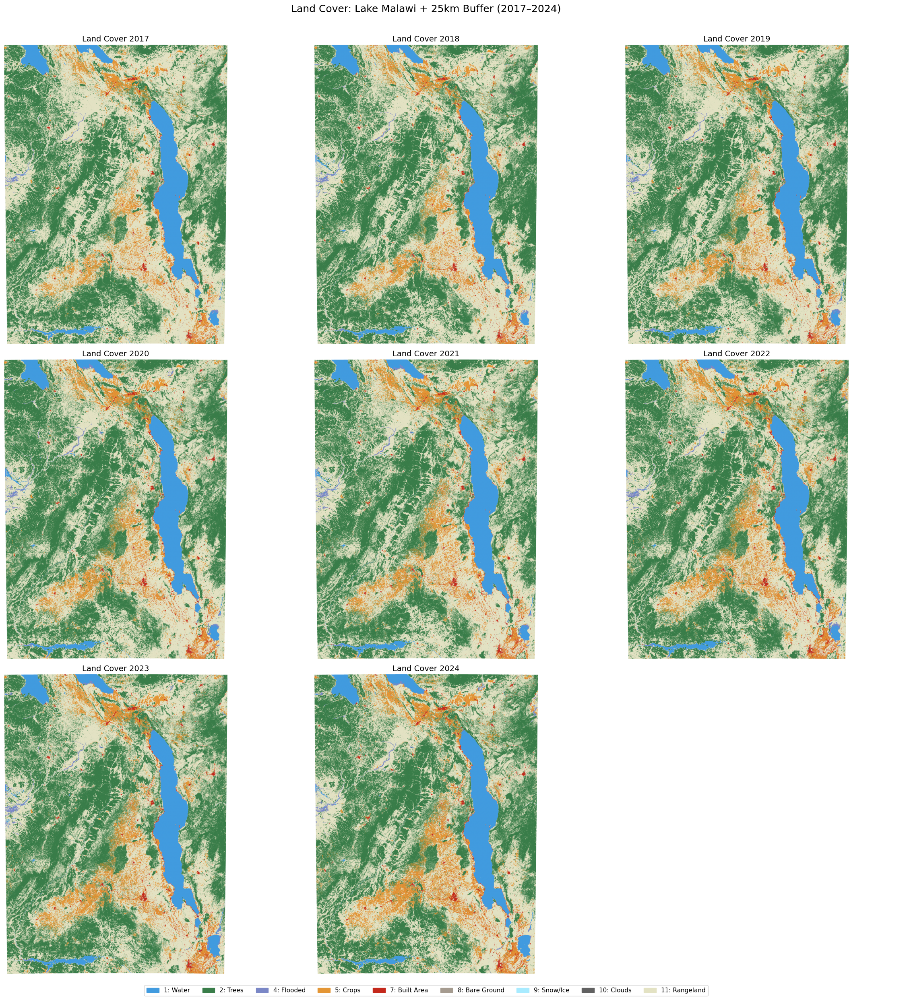

In [79]:
years = np.arange(2017, 2025, 1).tolist()
visualize_data(fp='../data/raw/', fn_index='malawi', years=years, sample_rate=0.1, cols=3)

## Analyze Land Cover within Buffered Lake Malawi Coordinates

The geotiff files contain the land cover data for a large region surrounding Lake Malawi. We'll mask the files to get the cover for the immediate area surrounding the lake.

In [28]:
malawi_buffered.geom_type

'Polygon'

In [77]:
def create_masked_profile(fn='malawi_2024.tif', buffered=malawi_buffered, buffered_coordinates=malawi_buffered_coordinates):
    with rasterio.open(input_path(fn)) as file:
        masked_data, masked_transform = create_mask(
        file,
        buffered.geom_type,
        buffered_coordinates
        )
        bounding_box = box(*file.bounds)
        if bounding_box.intersects(buffered):
            print(f"File: {fn}")
            
            stats = get_stats_from_mask(masked_data, file)
            print(f"Number of pixels: {stats['num_pixels']}")
            print(f"Number of land cover classes: {stats['num_classes']}")
            df = get_dataframe_from_mask(masked_data, file)
            print(df)
        else:
            print("No overlap detected. Mask is not correct")

        output_profile = file.profile.copy()

    output_profile.update({
    'height': masked_data.shape[1],
    'width': masked_data.shape[2],
    'transform': masked_transform
    })
    return output_profile, masked_data

In [80]:
for year in years:
    output_profile, masked_data = create_masked_profile(fn=f'malawi_{year}.tif', buffered=malawi_buffered, buffered_coordinates=malawi_buffered_coordinates)
    with rasterio.open(output_path(f'malawi_masked_{year}.tif'), 'w', **output_profile) as dst:
      dst.write(masked_data)

File: malawi_2017.tif
Number of pixels: 594349727
Number of land cover classes: 8
   Land Cover Class Land Cover Label  Number of Pixels  Percent Coverage
0                 1            Water         296062405         49.812828
1                 2            Trees          94756092         15.942817
2                 4          Flooded            279097          0.046958
3                 5            Crops          23663623          3.981431
4                 7       Built Area           8954681          1.506635
5                 8      Bare Ground            163789          0.027558
6                10           Clouds              5742          0.000966
7                11        Rangeland         170464298         28.680807
File: malawi_2018.tif
Number of pixels: 594349727
Number of land cover classes: 8
   Land Cover Class Land Cover Label  Number of Pixels  Percent Coverage
0                 1            Water         296140745         49.826008
1                 2            Tr

## Visualize Landcover for Lake Malawi and 25KM Surroudning It

Let's visualize the landcover for the buffered Lake Malawi area.

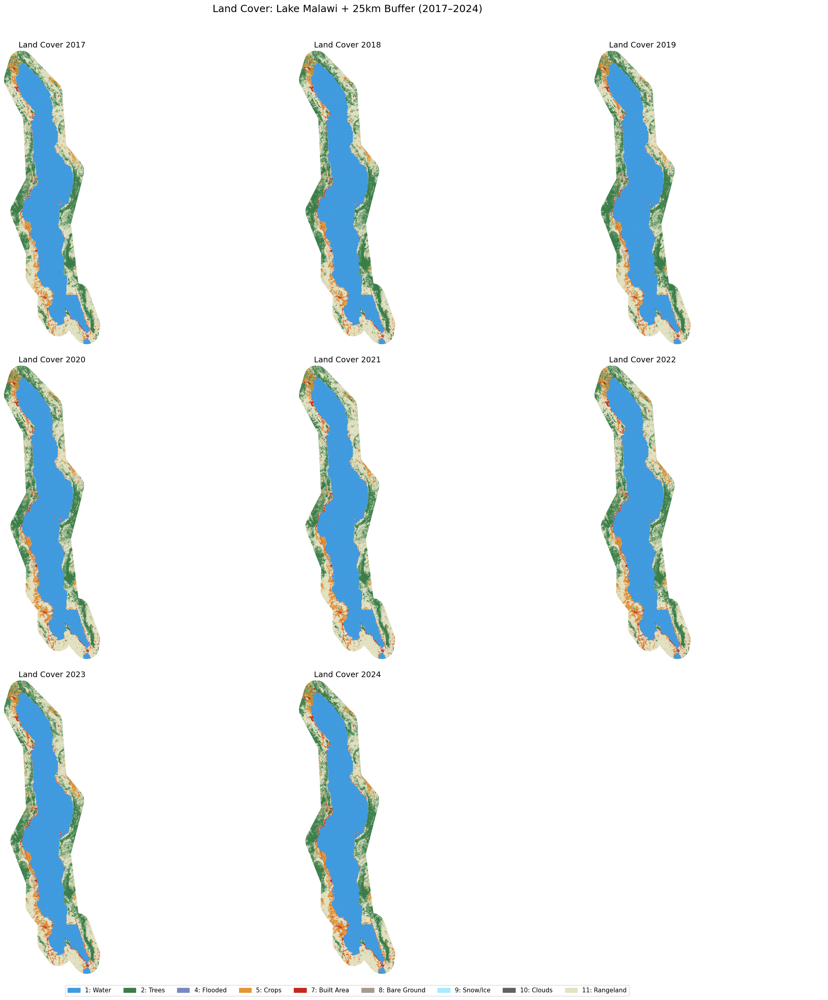

In [85]:
years = np.arange(2017, 2025, 1).tolist()
visualize_data(fp='../data/processed/', fn_index='malawi_masked', years=years, sample_rate=0.1, cols=3)

In [123]:
def get_pixel_at_latlon(target_path, lat, lon):
    """
    Get the land cover class at a specific lat/lon coordinate.
    
    Args:
        target_path: Path to the masked GeoTIFF
        lat: Latitude (WGS84)
        lon: Longitude (WGS84)
    
    Returns:
        dict with pixel info including land cover class and label
    """
    with rasterio.open(target_path) as src:
        # Transform lat/lon (EPSG:4326) to the file's CRS (EPSG:32736)
        transformer = pyproj.Transformer.from_crs("EPSG:4326", src.crs, always_xy=True)
        x, y = transformer.transform(lon, lat)
        
        # Convert projected coordinates to pixel row/col
        row, col = src.index(x, y)
        
        # Check bounds
        if row < 0 or row >= src.height or col < 0 or col >= src.width:
            return {"error": f"Coordinate ({lat}, {lon}) is outside the raster bounds."}
        
        # Read the pixel value
        pixel_value = int(src.read(1, window=rasterio.windows.Window(col, row, 1, 1))[0, 0])
        
        return {
            "lat": lat,
            "lon": lon,
            "projected_x": x,
            "projected_y": y,
            "row": row,
            "col": col,
            "class_id": pixel_value,
            "class_label": land_cover_labels.get(pixel_value, "NoData/Unknown"),
            "class_color": land_cover_colors.get(pixel_value, "#000000"),
        }


def get_landcover_block_at_latlon(target_path, lat, lon, radius_pixels=5, sample_rate=0.1):
    """
    Get a block of pixels surrounding a lat/lon coordinate.
    
    Args:
        target_path: Path to the masked GeoTIFF
        lat, lon: Center coordinate (WGS84)
        radius_pixels: Number of pixels around center to include
        sample_rate: Downsample factor to change resolution(0.1 = 10m→100m)
    
    Returns:
        dict with the pixel block and class breakdown
    """
    with rasterio.open(target_path) as file:
        new_height = int(file.height * sample_rate)
        new_width = int(file.width * sample_rate)

        # Read downsampled data (mode resampling for categorical)
        downsampled_data = file.read(
            out_shape=(file.count, new_height, new_width),
            resampling=Resampling.mode
        )

        # Compute the new transform for the downsampled grid
        new_transform = file.transform * Affine.scale(
            file.width / new_width,
            file.height / new_height
        )

        # Transform lat/lon to file CRS
        transformer = pyproj.Transformer.from_crs("EPSG:4326", file.crs, always_xy=True)
        x, y = transformer.transform(lon, lat)

        # Convert projected coords to row/col in downsampled grid
        inv_transform = ~new_transform
        col_f, row_f = inv_transform * (x, y)
        center_row, center_col = int(row_f), int(col_f)

        # Define window around center
        r_start = max(0, center_row - radius_pixels)
        c_start = max(0, center_col - radius_pixels)
        r_end = min(new_height, center_row + radius_pixels + 1)
        c_end = min(new_width, center_col + radius_pixels + 1)

        data = downsampled_data[0, r_start:r_end, c_start:c_end]

        # Get class breakdown
        nodata = file.nodata
        valid = data[data != nodata] if nodata is not None else data[data != 0]
        unique, counts = np.unique(valid, return_counts=True)

        breakdown = []
        for val, cnt in zip(unique, counts):
            breakdown.append({
                "class_id": int(val),
                "label": land_cover_labels.get(int(val), f"Class {int(val)}"),
                "pixel_count": int(cnt),
                "percentage": round(float(cnt / len(valid) * 100), 2),
            })

        return {
            "center": {"lat": lat, "lon": lon},
            "block_shape": data.shape,
            "details": breakdown,
            "raw_data": data.tolist(),
        }

In [133]:
# Look into a small window size's info which is centered with certain lat/lon
target_path = Path('../data/processed', 'malawi_masked_2024.tif')
result = get_landcover_block_at_latlon(target_path, lat=-11.425259, lon=34.406701, radius_pixels=7, sample_rate=0.1) # e.g. water: (-11.425259, 34.406701), trees: (-11.489745, 34.108476)

print(f"Block shape: {result['block_shape']}")
print(f"Block details:")
for cls in result['details']:
    print(f" {cls['label']}: {cls['pixel_count']} pixels ({cls['percentage']}%)")
print(f"Raw data: ")
print(f" {result['raw_data']}")

Block shape: (15, 15)
Block details:
 Water: 225 pixels (100.0%)
Raw data: 
 [[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]]


In [135]:
with rasterio.open(target_path) as src:
    bounds = src.bounds  # (left, bottom, right, top) in the file's CRS
    print(f"Bounds: {bounds}")
    
    # Upper-left and bottom-right in the file's CRS (EPSG:32736)
    upper_left = (bounds.left, bounds.top)
    bottom_right = (bounds.right, bounds.bottom)
    center = ((bounds.left + bounds.right) / 2, (bounds.top + bounds.bottom) / 2)
    
    print(f"CRS: {src.crs}")
    print(f"Upper-left (CRS):    {upper_left}")
    print(f"Bottom-right (CRS):  {bottom_right}")
    print(f"Center (CRS):        {center}")
    
    # Convert to lat/lon (EPSG:4326)
    transformer = pyproj.Transformer.from_crs(src.crs, "EPSG:4326", always_xy=True)
    
    ul_lon, ul_lat = transformer.transform(*upper_left)
    br_lon, br_lat = transformer.transform(*bottom_right)
    c_lon, c_lat = transformer.transform(*center)
    
    print(f"\nUpper-left (lat/lon):   ({ul_lat}, {ul_lon})")
    print(f"Bottom-right (lat/lon): ({br_lat}, {br_lon})")
    print(f"Center (lat/lon):       ({c_lat}, {c_lon})")

Bounds: BoundingBox(left=574420.0, bottom=8381720.0, right=768840.0, top=8975220.0)
CRS: EPSG:32736
Upper-left (CRS):    (574420.0, 8975220.0)
Bottom-right (CRS):  (768840.0, 8381720.0)
Center (CRS):        (671630.0, 8678470.0)

Upper-left (lat/lon):   (-9.270056688306965, 33.67756981825955)
Bottom-right (lat/lon): (-14.62455709107763, 35.49566767136874)
Center (lat/lon):       (-11.950147944877394, 34.576153269732615)


## Visualize Landcover Changes

See the changes in landcover from 2017-2024

    Land Cover Class Land Cover Label  Number of Pixels  Percent Coverage  \
0                  1            Water         296062405         49.812828   
1                  2            Trees          94756092         15.942817   
2                  4          Flooded            279097          0.046958   
3                  5            Crops          23663623          3.981431   
4                  7       Built Area           8954681          1.506635   
..               ...              ...               ...               ...   
59                 5            Crops          31337596          5.272585   
60                 7       Built Area          12553491          2.112139   
61                 8      Bare Ground             35388          0.005954   
62                10           Clouds              4004          0.000674   
63                11        Rangeland         147209742         24.768202   

    Year  
0   2017  
1   2017  
2   2017  
3   2017  
4   2017  
..   ... 

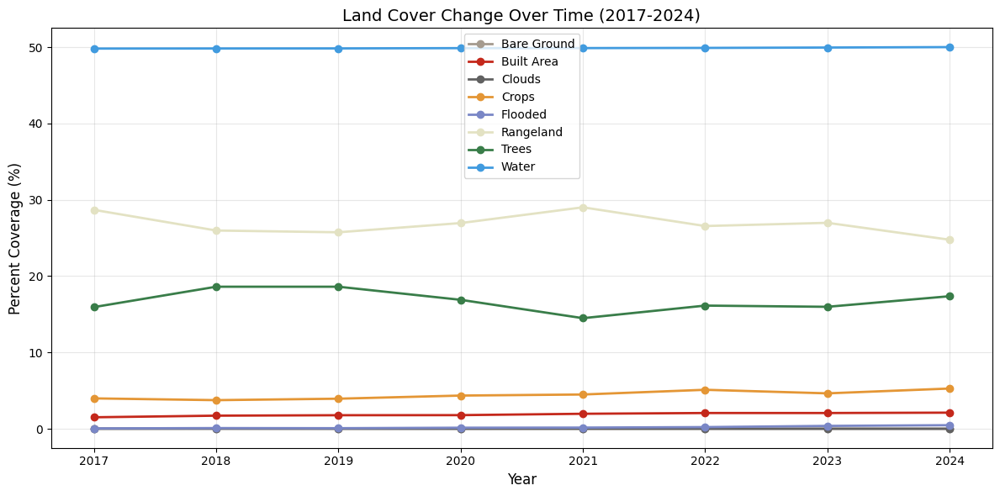

In [33]:
frames = []
for year in years:
  with rasterio.open(input_path(f"malawi_{year}.tif")) as file:
    masked_data, masked_transform = create_mask(
      file,
      malawi_buffered.geom_type,
      malawi_buffered_coordinates
    )
    bounding_box = box(*file.bounds)
    if bounding_box.intersects(malawi_buffered):
      df = get_dataframe_from_mask(masked_data, file)
      frames.append(df)

for i, year in enumerate(years):
  frames[i]['Year'] = year

combined_df = pd.concat(frames, ignore_index=True)
print(combined_df)
pivot_df = combined_df.pivot(index='Year', columns='Land Cover Label', values='Percent Coverage')
fig, ax = plt.subplots(figsize=(12, 6))
for label in pivot_df.columns:
  class_val = [k for k, v in land_cover_labels.items() if v == label][0]
  color = land_cover_colors.get(class_val, '#000000')
  ax.plot(pivot_df.index, pivot_df[label], marker='o', label=label, color=color, linewidth=2)

ax.set_xlabel('Year', fontsize=12)
ax.set_ylabel('Percent Coverage (%)', fontsize=12)
ax.set_title('Land Cover Change Over Time (2017-2024)', fontsize=14)
ax.legend(loc='best')
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

In [88]:
output_path = Path('../data/processed/malawi_masked_2024.tif')
sample_rate = 0.1
with rasterio.open(output_path) as file:
    downsampled_data = file.read(
        out_shape=(
            file.count,
            int(file.height * sample_rate),
            int(file.width * sample_rate)
        ),
        resampling=Resampling.mode
    )